In [1]:

# imports
import os
import sys
import types
import json
import base64

# figure size/format
fig_width = 10
fig_height = 5
fig_format = 'retina'
fig_dpi = 96
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = "figure"

  # IPython 7.14 deprecated set_matplotlib_formats from IPython
  try:
    from matplotlib_inline.backend_inline import set_matplotlib_formats
  except ImportError:
    # Fall back to deprecated location for older IPython versions
    from IPython.display import set_matplotlib_formats
    
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
run_path = 'L2hvbWUvbXV6aWtyL0dpdFJlcG9zaXRvcmllcy9wZXJzb25hbC9wcmFndWUtcHViLW1hcC9wcmVzZW50YXRpb24='
if run_path:
  # hex-decode the path
  run_path = base64.b64decode(run_path.encode("utf-8")).decode("utf-8")
  os.chdir(run_path)

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define
globals()["__spec__"] = None

{"/usr/lib/python3.11/importlib/_bootstrap.py": 1763971067.0, "/usr/lib/python3.11/importlib/_bootstrap_external.py": 1763971067.0, "/usr/lib/python3.11/zipimport.py": 1763971067.0, "/usr/lib/python3.11/codecs.py": 1763971067.0, "/usr/lib/python3.11/encodings/aliases.py": 1763971067.0, "/usr/lib/python3.11/encodings/__init__.py": 1763971067.0, "/usr/lib/python3.11/encodings/utf_8.py": 1763971067.0, "/usr/lib/python3.11/abc.py": 1763971067.0, "/usr/lib/python3.11/io.py": 1763971067.0, "/usr/lib/python3.11/stat.py": 1763971067.0, "/usr/lib/python3.11/_collections_abc.py": 1763971067.0, "/usr/lib/python3.11/genericpath.py": 1763971067.0, "/usr/lib/python3.11/posixpath.py": 1763971067.0, "/usr/lib/python3.11/os.py": 1763971067.0, "/usr/lib/python3.11/_sitebuiltins.py": 1763971067.0, "/home/muzikr/GitRepositories/personal/prague-pub-map/.venv/lib/python3.11/site-packages/_virtualenv.py": 1764613775.7144651, "/home/muzikr/GitRepositories/personal/prague-pub-map/.venv/lib/python3.11/site-pack

In [2]:
print("Hello, World!")

Hello, World!


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

MAX_WIDTH = 8

prague_pubs_df = pd.read_csv("../data/pub_urls_Prague.csv", sep=";")
prague_pubs_df.head()

,name,region,url,rating,number_of_reviews,latitude,longitude,menu_item,price
0,Pivovarský dům Benedict,Prague,https://www.firmy.cz/detail/13503510-pivovarsk...,4.7,116.0,50.075451,14.423677,NaN,NaN
1,U Matěje Kotrby - Restaurace a Bar,Prague,https://www.firmy.cz/detail/2004407-u-mateje-k...,4.5,70.0,50.079464,14.416620,NaN,NaN
2,Penzion-restaurant U Hofmanů,Prague,https://www.firmy.cz/detail/12866962-penzion-r...,3.6,53.0,50.122563,14.454215,"130g Sví?ková na smetan?, houskový knedlík, br...",195 Kč
3,Penzion-restaurant U Hofmanů,Prague,https://www.firmy.cz/detail/12866962-penzion-r...,3.6,53.0,50.122563,14.454215,130g Hov?zí gulá? s houskovým knedlíkem,175 Kč
4,Penzion-restaurant U Hofmanů,Prague,https://www.firmy.cz/detail/12866962-penzion-r...,3.6,53.0,50.122563,14.454215,130g Pe?ená vep?ová plec se zelím a houskovým ...,155 Kč


In [4]:
# load all the czech region files into one dataframe.
# The files are located in ../data/ and have names like pubs_urls_<region>.csv
# Additionaly add column with region name
import os
import glob

all_files = glob.glob("../data/pub_urls_*.csv")

list_df = []
for file in all_files:
    region = os.path.basename(file).replace("pub_urls_", "").replace(".csv", "")
    df = pd.read_csv(file, sep=";")
    df['region'] = region
    list_df.append(df)

czech_pubs_df = pd.concat(list_df, ignore_index=True)
czech_pubs_df.head()

,name,region,url,rating,number_of_reviews,latitude,longitude,menu_item,price
0,Restaurace - Hospůdka Bobovka Lipno,Jihočeský,https://www.firmy.cz/detail/13821716-restaurac...,4.6,55.0,48.646700,14.221776,NaN,NaN
1,Restaurace Holenský Dvůr,Jihočeský,https://www.firmy.cz/detail/13499441-restaurac...,4.3,28.0,49.153368,14.882953,NaN,NaN
2,Chatový tábor Malý Ratmírov,Jihočeský,https://www.firmy.cz/detail/13264069-chatovy-t...,4.2,39.0,49.140481,15.116193,NaN,NaN
3,Hospoda U Dračice,Jihočeský,https://www.firmy.cz/detail/13833074-hospoda-u...,4.9,74.0,48.894457,14.937499,NaN,NaN
4,HOSPODA POD HRÁZÍ,Jihočeský,https://www.firmy.cz/detail/13399003-hospoda-p...,5.0,1.0,49.182687,14.319426,NaN,NaN


In [5]:
import re

# parse price like "150 Kč" (or "150-200 Kč") -> numeric (mean if multiple numbers)
def parse_price(s):
  if pd.isna(s):
    return np.nan
  nums = re.findall(r'\d+', str(s))
  if not nums:
    return np.nan
  nums = [int(n) for n in nums]
  return float(np.mean(nums))

  # create numeric price column per row
prague_pubs_df['price_num'] = prague_pubs_df.get('price', prague_pubs_df.get('menu_price', pd.Series([np.nan]*len(prague_pubs_df)))).apply(parse_price)
czech_pubs_df['price_num'] = czech_pubs_df.get('price', czech_pubs_df.get('menu_price', pd.Series([np.nan]*len(czech_pubs_df)))).apply(parse_price)

In [6]:
import contextily as ctx
import geopandas as gpd

def analyze_df(df):
    print(f"Total number of lines: {len(df)}")
    print(f"Number of duplicate lines: {df.duplicated().sum()}")
    print(f"Number of unique pubs: {df.groupby('url').ngroups}")
    print(f"Number of missing values:\n{df.isna().sum()}")

def plot_all_pubs(df, title, marker_size=30):
  # Convert your DataFrame into a GeoDataFrame
  # keep only one row per unique URL (first occurrence)
  df_unique = df.drop_duplicates(subset="url", keep="first")

  gdf = gpd.GeoDataFrame(
    df_unique,
    geometry=gpd.points_from_xy(df_unique.longitude, df_unique.latitude),
    crs="EPSG:4326"   # WGS84 lat/lon
  )

  # Convert to Web Mercator
  gdf = gdf.to_crs(epsg=3857)

  # Plot
  fig, ax = plt.subplots(figsize=(MAX_WIDTH,MAX_WIDTH))
  gdf.plot(ax=ax, color="blue", alpha=0.7, markersize=marker_size)

  # Add basemap
  ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

  plt.title(f"Pubs in {title}")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.show()

def plot_filter_rating(df, title, marker_size_dots=30, marker_size_x=40):
  # keep only rows with non-empty rating, then one row per url
  mask_rated = df['rating'].notna() & (df['rating'].astype(str).str.strip() != '')
  df_filtered = df[mask_rated]
  df_unique = df_filtered.drop_duplicates(subset="url", keep="first")

  # rows without rating (also one row per url)
  mask_unrated = ~mask_rated
  df_no_rating = df[mask_unrated].drop_duplicates(subset="url", keep="first")
  # GeoDataFrames
  gdf_rated = gpd.GeoDataFrame(
    df_unique,
    geometry=gpd.points_from_xy(df_unique.longitude, df_unique.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  gdf_unrated = gpd.GeoDataFrame(
    df_no_rating,
    geometry=gpd.points_from_xy(df_no_rating.longitude, df_no_rating.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  # Plot
  fig, ax = plt.subplots(figsize=(MAX_WIDTH,MAX_WIDTH))
  # rated pubs (e.g., blue)
  gdf_rated.plot(ax=ax, color="blue", alpha=0.7, markersize=marker_size_dots, label="With rating")
  # unrated pubs as red points
  gdf_unrated.plot(ax=ax, color="red", alpha=0.9, markersize=marker_size_x, marker="x", label="No rating")

  # Add basemap
  ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

  plt.title(f"Pubs in {title} (rated = blue, no rating = red)")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.legend()
  plt.show()

def plot_rating(df, title, min_size=30, max_size=350):
  # keep only rows with non-empty rating, then one row per url
  mask_rated = df['rating'].notna() & (df['rating'].astype(str).str.strip() != '')
  df_filtered = df[mask_rated].drop_duplicates(subset="url", keep="first").copy()

  # ensure rating is numeric
  df_filtered['rating_num'] = pd.to_numeric(df_filtered['rating'], errors='coerce')
  df_filtered = df_filtered[df_filtered['rating_num'].notna()]

  # ensure number_of_reviews is numeric (int) and fill missing with 0
  df_filtered['num_reviews'] = pd.to_numeric(df_filtered.get('number_of_reviews', pd.Series(dtype='float')), errors='coerce').fillna(0).astype(int)

  # rows without rating (also one row per url)
  mask_unrated = ~mask_rated
  df_no_rating = df[mask_unrated].drop_duplicates(subset="url", keep="first")
  # GeoDataFrames
  gdf_rated = gpd.GeoDataFrame(
    df_filtered,
    geometry=gpd.points_from_xy(df_filtered.longitude, df_filtered.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  gdf_unrated = gpd.GeoDataFrame(
    df_no_rating,
    geometry=gpd.points_from_xy(df_no_rating.longitude, df_no_rating.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  # Plot: color by rating (1 = red, 5 = green) using RdYlGn colormap
  fig, ax = plt.subplots(figsize=(MAX_WIDTH,MAX_WIDTH))

  # plot unrated first so rated points are on top
  if not gdf_unrated.empty:
      gdf_unrated.plot(ax=ax, color="lightgray", alpha=0.8, markersize=40, marker="x", label="No rating")

  # scatter rated points with colormap; size corresponds to number_of_reviews
  ratings = gdf_rated['rating_num'].astype(float)
  x = gdf_rated.geometry.x
  y = gdf_rated.geometry.y
  num_reviews = gdf_rated['num_reviews'].astype(int)

  # scale sizes: map num_reviews to a reasonable marker area range [min_size, max_size]
  if len(num_reviews) == 0:
      sizes = np.array([])
  else:
      nmin = int(num_reviews.min())
      nmax = int(num_reviews.max())
      if nmax == nmin:
          sizes = np.full(len(num_reviews), (min_size + max_size) / 2.0)
      else:
          sizes = min_size + (num_reviews - nmin) / (nmax - nmin) * (max_size - min_size)

  cmap = plt.get_cmap('RdYlGn')   # low=red, high=green
  norm = plt.Normalize(vmin=1, vmax=5)

  sc = ax.scatter(x, y, c=ratings, cmap=cmap, norm=norm, s=sizes, edgecolor='k', linewidth=0.2, alpha=0.9, label="With rating (size = #reviews)")

  # Add basemap
  ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

  plt.title(f"Pubs in {title} (colored by rating: 1=red ... 5=green; size = number of reviews)")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.legend()

  # colorbar for the ratings
  cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
  cbar.set_label('Rating')

  plt.show()

def plot_average_rating_per_region(df):
  # average rating per region
  mask_rated = df['rating'].notna() & (df['rating'].astype(str).str.strip() != '')
  df_filtered = df[mask_rated].drop_duplicates(subset="url", keep="first").copy()

  # ensure rating is numeric
  df_filtered['rating_num'] = pd.to_numeric(df_filtered['rating'], errors='coerce')
  df_filtered = df_filtered[df_filtered['rating_num'].notna()]

  avg_rating = df_filtered.groupby('region')['rating_num'].mean().reset_index()

  plt.figure(figsize=(10,6))
  sns.barplot(data=avg_rating, x='region', y='rating_num', palette='viridis')
  plt.title("Average Rating per Region")
  plt.xlabel("Region")
  plt.ylabel("Average Rating")
  plt.ylim(0, 5)
  plt.xticks(rotation=45)
  plt.grid(axis='y', alpha=0.75)
  plt.show()

def plot_rating_histogram(df, title):
  # keep only rows with non-empty rating
  mask_rated = df['rating'].notna() & (df['rating'].astype(str).str.strip() != '')
  df_filtered = df[mask_rated].drop_duplicates(subset="url", keep="first").copy()

  # ensure rating is numeric
  df_filtered['rating_num'] = pd.to_numeric(df_filtered['rating'], errors='coerce')
  df_filtered = df_filtered[df_filtered['rating_num'].notna()]
  ratings = df_filtered['rating_num'].astype(float)
  plt.figure(figsize=(8,5))
  sns.histplot(ratings, bins=np.arange(0.5, 5.6, 0.1), kde=False, color='blue')
  plt.title(f"Histogram of Ratings for Pubs in {title}")
  plt.xlabel("Rating")
  plt.ylabel("Number of Pubs")
  plt.xlim(0.5, 5.5)
  plt.grid(axis='y', alpha=0.75)
  plt.show()

def print_min_max_rating_filtered(df, minimal_reviews=10):
  # keep only rows with non-empty rating, one row per url
  mask_rated = df['rating'].notna() & (df['rating'].astype(str).str.strip() != '')
  df_unique = df[mask_rated].drop_duplicates(subset="url", keep="first").copy()

  # ensure rating is numeric
  df_unique['rating_num'] = pd.to_numeric(df_unique['rating'], errors='coerce')
  df_unique = df_unique[df_unique['rating_num'].notna()]

  df_unique = df_unique[df_unique['number_of_reviews'] >= minimal_reviews]

  if df_unique.empty:
    print("No ratings available.")
    return

  min_r = float(df_unique['rating_num'].min())
  max_r = float(df_unique['rating_num'].max())

  print(f"Minimum rating: {min_r}")
  min_rows = df_unique[np.isclose(df_unique['rating_num'].astype(float), min_r)]
  print(f"Number of pubs with minimum rating: {len(min_rows)}")
  # print relevant columns
  print(min_rows[['name','rating','number_of_reviews']].to_string(index=False))

  print(f"\nMaximum rating: {max_r}")
  max_rows = df_unique[np.isclose(df_unique['rating_num'].astype(float), max_r)]
  print(f"Number of pubs with maximum rating: {len(max_rows)}")
  print(max_rows[['name','rating','number_of_reviews']].to_string(index=False))

def plot_filter_price(df, title, marker_size_dots=30, marker_size_x=40):
  # keep only rows with non-empty rating, then one row per url
  # determine whether each restaurant (unique url) has at least one non-empty menu_item
  has_menu = df.groupby('url')['menu_item'].apply(
    lambda s: (s.notna() & (s.astype(str).str.strip() != '')).any()
  )

  # take first row per url for coords/metadata and attach flag
  unique = df.drop_duplicates(subset='url', keep='first').set_index('url')
  unique['has_menu'] = has_menu.reindex(unique.index).fillna(False)

  # split into with/without menu
  with_menu = unique[unique['has_menu']]
  no_menu = unique[~unique['has_menu']]

  # GeoDataFrames
  gdf_with = gpd.GeoDataFrame(
    with_menu,
    geometry=gpd.points_from_xy(with_menu.longitude, with_menu.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  gdf_no = gpd.GeoDataFrame(
    no_menu,
    geometry=gpd.points_from_xy(no_menu.longitude, no_menu.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  # Plot: blue dots = has menu, red X = no menu
  fig, ax = plt.subplots(figsize=(MAX_WIDTH,MAX_WIDTH))
  if not gdf_no.empty:
    gdf_no.plot(ax=ax, color="red", marker="x", markersize=marker_size_x, alpha=0.9, label="No menu")
  if not gdf_with.empty:
    gdf_with.plot(ax=ax, color="blue", markersize=marker_size_dots, alpha=0.7, label="Has menu")

  ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)
  plt.title(f"Pubs in {title} (has menu = blue, no menu = red)")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.legend()
  plt.show()

def plot_price(df, title):
  # average price per unique URL (restaurant/pub)
  price_avg = df.groupby('url')['price_num'].apply(lambda s: s.dropna().mean())

  # take first row per url for coords/metadata and attach avg_price
  unique = df.drop_duplicates(subset='url', keep='first').set_index('url')
  unique['avg_price'] = price_avg.reindex(unique.index)
  # split into with/without avg_price
  with_price = unique[unique['avg_price'].notna()].reset_index()
  no_price = unique[unique['avg_price'].isna()].reset_index()

  # GeoDataFrames
  gdf_with = gpd.GeoDataFrame(
    with_price,
    geometry=gpd.points_from_xy(with_price.longitude, with_price.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  gdf_no = gpd.GeoDataFrame(
    no_price,
    geometry=gpd.points_from_xy(no_price.longitude, no_price.latitude),
    crs="EPSG:4326"
  ).to_crs(epsg=3857)

  # Plot: cheapest (green) -> most expensive (red). Use reversed RdYlGn so low=green, high=red.
  fig, ax = plt.subplots(figsize=(MAX_WIDTH,MAX_WIDTH))

  if not gdf_no.empty:
    gdf_no.plot(ax=ax, color="lightgray", alpha=0.8, markersize=40, marker="x", label="No price")

  if not gdf_with.empty:
    prices = gdf_with['avg_price'].astype(float)
    x = gdf_with.geometry.x
    y = gdf_with.geometry.y

    cmap = plt.get_cmap('RdYlGn_r')   # reversed: low=green, high=red
    vmin = prices.min()
    vmax = prices.max()
    if np.isclose(vmin, vmax):
      vmin = max(0, vmin - 1)
      vmax = vmax + 1
    norm = plt.Normalize(vmin=vmin, vmax=vmax)

    sc = ax.scatter(x, y, c=prices, cmap=cmap, norm=norm, s=50, edgecolor='k', linewidth=0.2, alpha=0.9, label="With avg price")

  # Add basemap
  ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

  plt.title(f"Pubs in {title} (colored by average price; green=cheapest, red=most expensive)")
  plt.xlabel("Longitude")
  plt.ylabel("Latitude")
  plt.legend()

  # colorbar for average price
  if 'sc' in locals():
    cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label('Average price (Kč)')

  plt.show()

def print_min_max_price(df):
  # average price per unique URL (restaurant/pub)
  price_avg = df.groupby('url')['price_num'].apply(lambda s: s.dropna().mean())

  # take first row per url for coords/metadata and attach avg_price
  unique = df.drop_duplicates(subset='url', keep='first').set_index('url')
  unique['avg_price'] = price_avg.reindex(unique.index)

  # filter to those with avg_price
  unique = unique[unique['avg_price'].notna()]

  if unique.empty:
    print("No price data available.")
    return

  min_p = float(unique['avg_price'].min())
  max_p = float(unique['avg_price'].max())

  print(f"Minimum average price: {min_p:.2f} Kč")
  min_rows = unique[np.isclose(unique['avg_price'].astype(float), min_p)]
  print(f"Number of pubs with minimum average price: {len(min_rows)}")
  print(min_rows.reset_index()[['name','avg_price']].to_string(index=False))

  print(f"\nMaximum average price: {max_p:.2f} Kč")
  max_rows = unique[np.isclose(unique['avg_price'].astype(float), max_p)]
  print(f"Number of pubs with maximum average price: {len(max_rows)}")
  print(max_rows.reset_index()[['name','avg_price']].to_string(index=False))

In [7]:
analyze_df(prague_pubs_df)

# get rid of dupilicate lines
prague_pubs_df = prague_pubs_df.drop_duplicates()

Total number of lines: 666
Number of duplicate lines: 0
Number of unique pubs: 205
Number of missing values:
name                   0
region                 0
url                    0
rating                19
number_of_reviews     19
latitude               0
longitude              0
menu_item            193
price                193
price_num            193
dtype: int64


In [8]:
# print all unique ratings
print("Unique ratings:")
print(prague_pubs_df['rating'].unique())

Unique ratings:
[4.7 4.5 3.6 3.7 4.2 5.  4.4 4.1 4.6 4.9 2.5 nan 4.8 4.  3.9 3.8 4.3 3.2
 2.8 3.5 1.  3.4 3.  3.3 2.6 1.5]


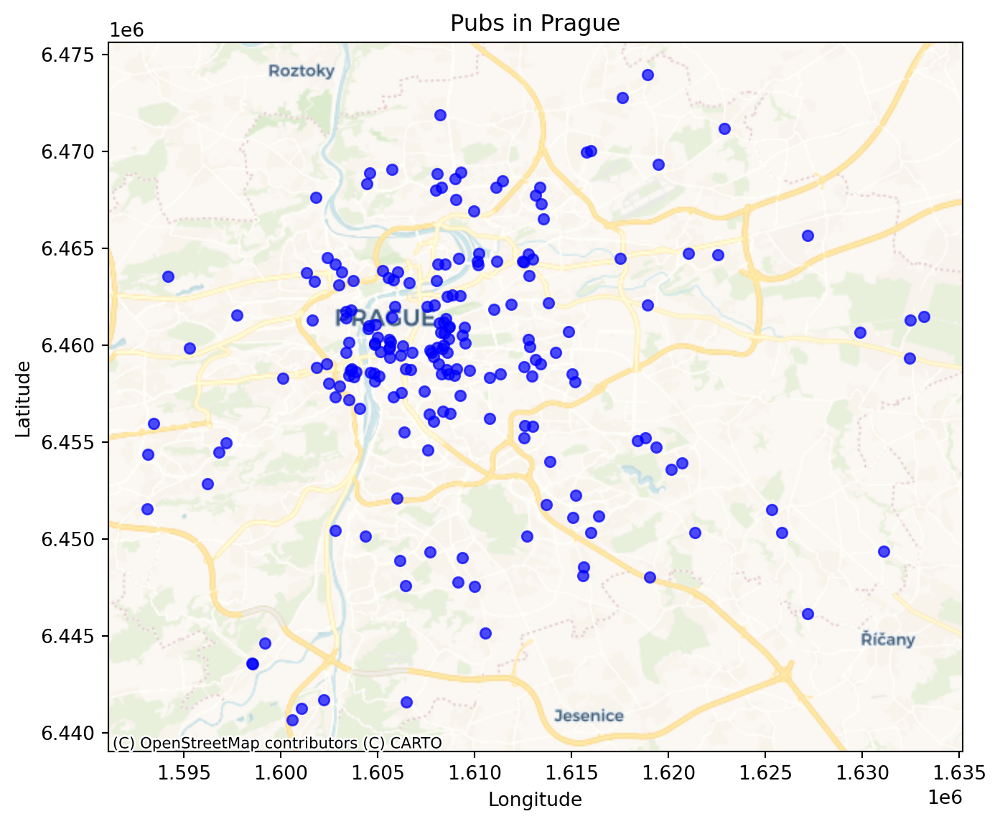

In [9]:
plot_all_pubs(prague_pubs_df, "Prague")

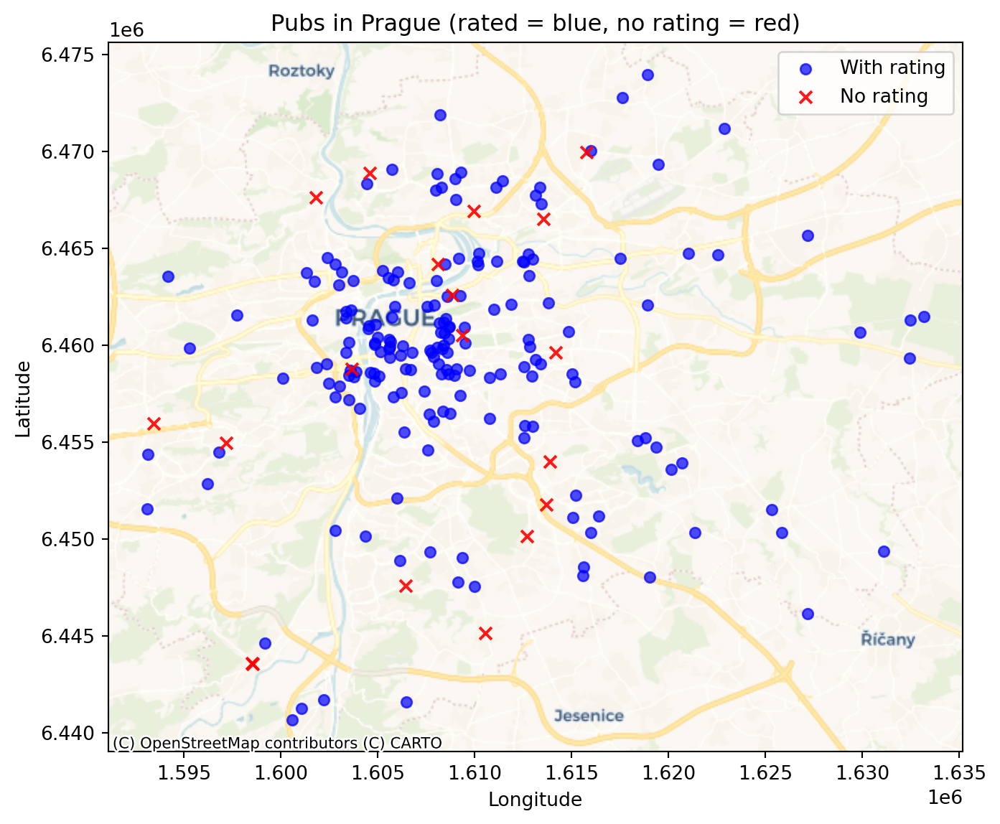

In [10]:
plot_filter_rating(prague_pubs_df, "Prague")

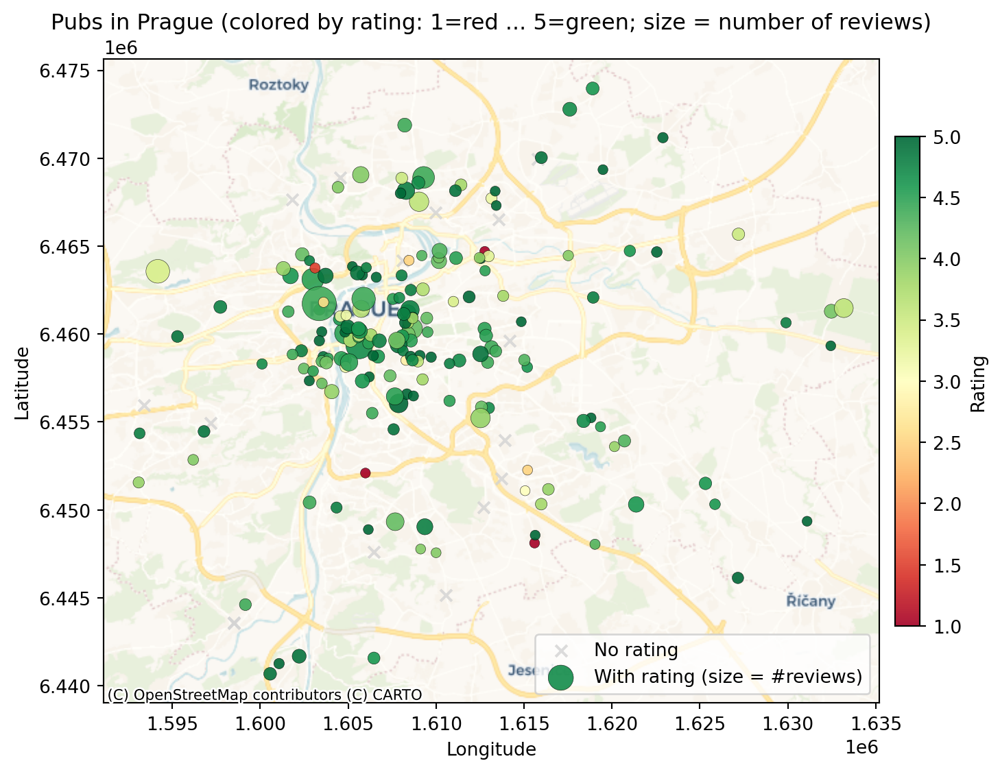

In [11]:
plot_rating(prague_pubs_df, "Prague")

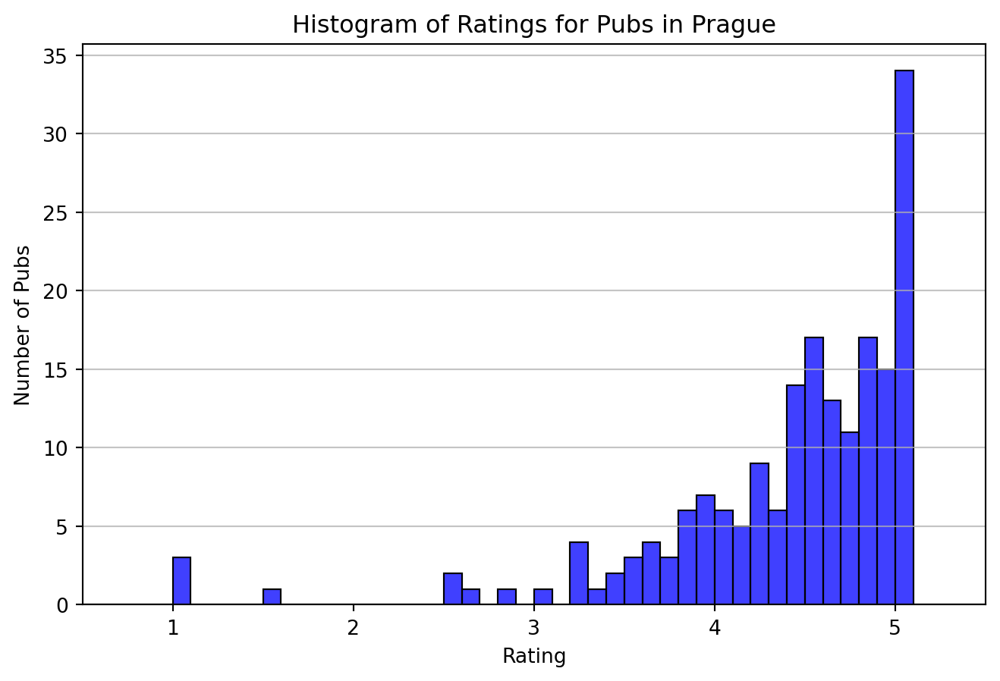

In [12]:
plot_rating_histogram(prague_pubs_df, "Prague")

In [13]:
print_min_max_rating_filtered(prague_pubs_df,1)

Minimum rating: 1.0
Number of pubs with minimum rating: 3
         name  rating  number_of_reviews
Karel MLEJNEK     1.0                1.0
 Výčep Fialka     1.0                1.0
   NA OLYMPII     1.0                1.0

Maximum rating: 5.0
Number of pubs with maximum rating: 34
                         name  rating  number_of_reviews
         Pivní bar Černá ruka     5.0                4.0
              Výčep Balabenka     5.0                3.0
  Občerstvení grill Xaveriova     5.0                2.0
    Pivní laboratoř U Rumlíka     5.0               48.0
                  3J Beer Bar     5.0                4.0
             Hospoda U Kačera     5.0                3.0
          Těsně vedle Burundi     5.0                1.0
                  Vajtfiš BAR     5.0                1.0
               Kozel na Mostě     5.0                4.0
                   U Tiskárny     5.0                3.0
             Pivotéka ŽižkOff     5.0                1.0
             Pivnice U Marešů     

In [14]:
print_min_max_rating_filtered(prague_pubs_df)

Minimum rating: 3.4
Number of pubs with minimum rating: 1
               name  rating  number_of_reviews
Hostinec Dívčí skok     3.4               87.0

Maximum rating: 5.0
Number of pubs with maximum rating: 2
                     name  rating  number_of_reviews
Pivní laboratoř U Rumlíka     5.0               48.0
        Hospoda Za Větrem     5.0               10.0


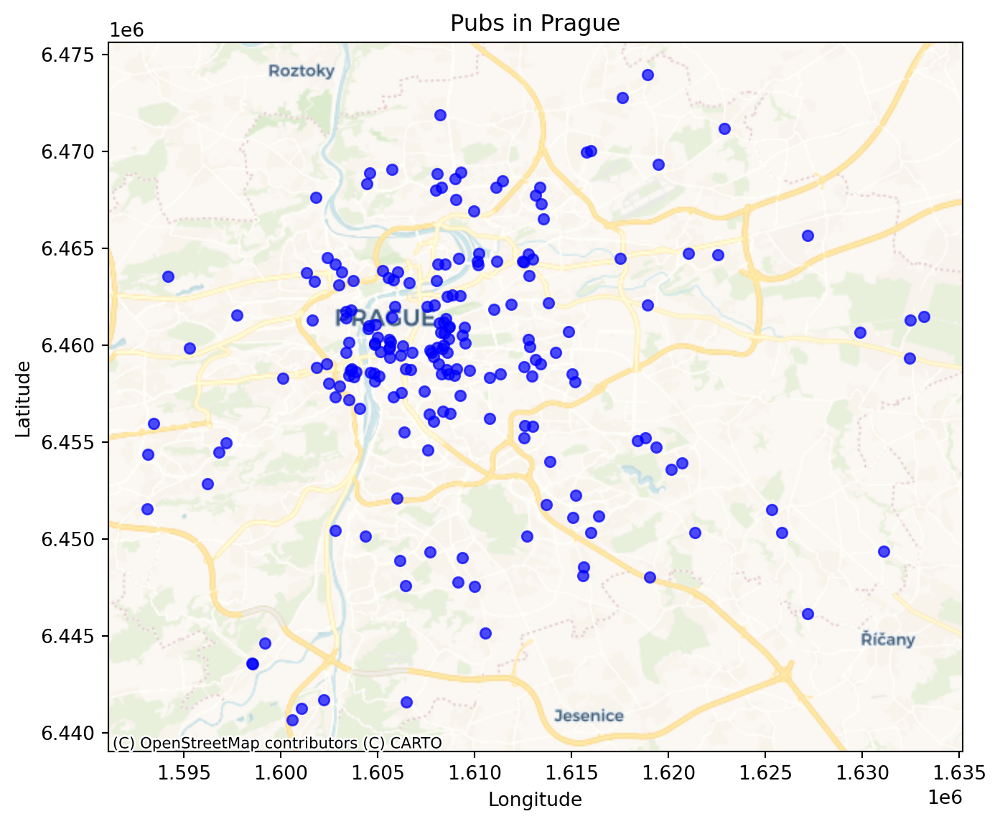

In [15]:
plot_all_pubs(prague_pubs_df, "Prague")

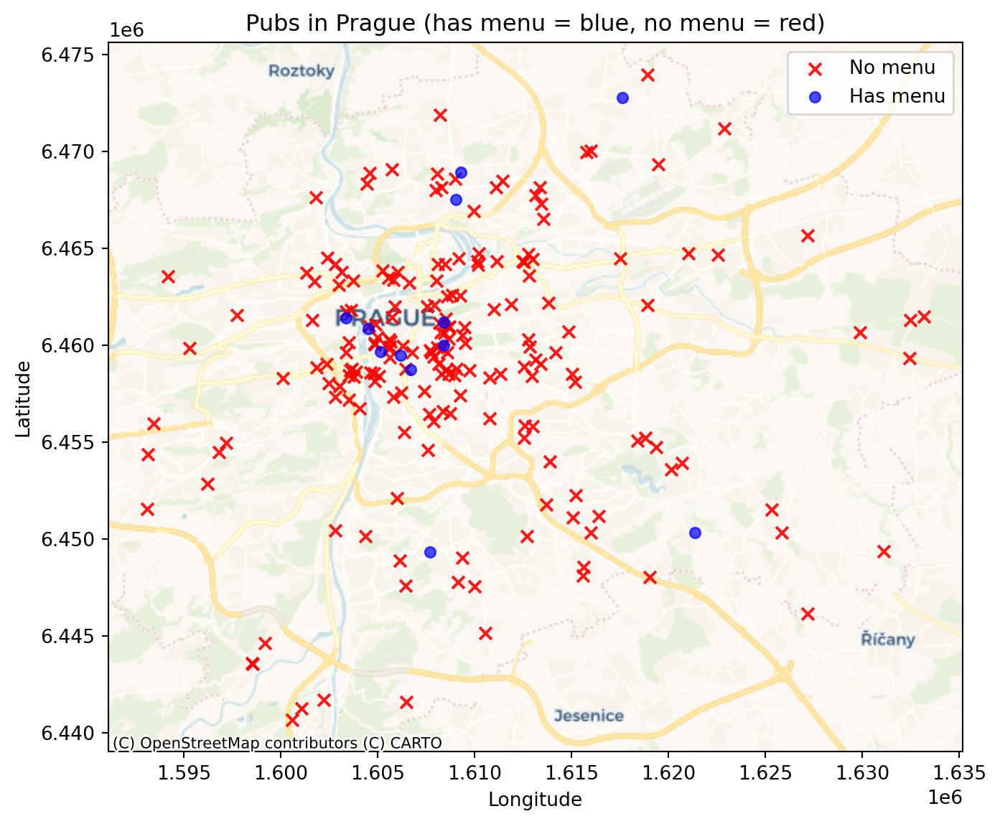

In [16]:
plot_filter_price(prague_pubs_df, "Prague")

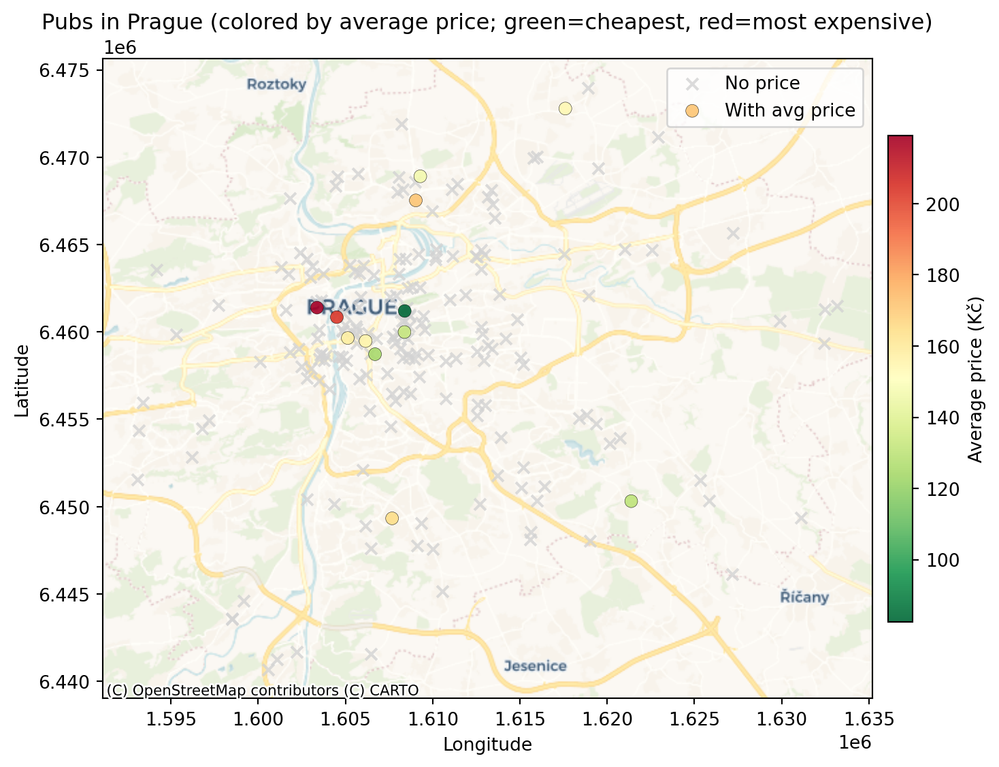

In [17]:
plot_price(prague_pubs_df, "Prague")

In [18]:
print_min_max_price(prague_pubs_df)

Minimum average price: 82.50 Kč
Number of pubs with minimum average price: 1
          name  avg_price
Pivnice U Járy       82.5

Maximum average price: 219.17 Kč
Number of pubs with maximum average price: 1
                   name  avg_price
J.J. Murphy´s Irish Pub 219.166667


In [19]:
analyze_df(czech_pubs_df)

czech_pubs_df = czech_pubs_df.drop_duplicates()

Total number of lines: 5785
Number of duplicate lines: 30
Number of unique pubs: 4513
Number of missing values:
name                    0
region                  0
url                    18
rating                932
number_of_reviews     932
latitude               18
longitude              18
menu_item            4519
price                4519
price_num            4519
dtype: int64


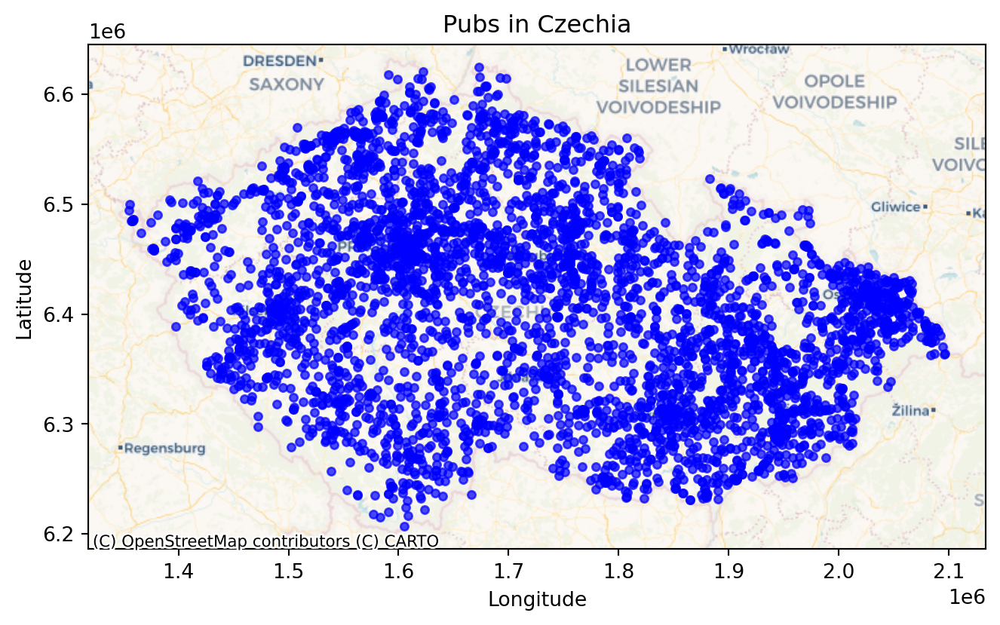

In [20]:
plot_all_pubs(czech_pubs_df, "Czechia", marker_size=15)

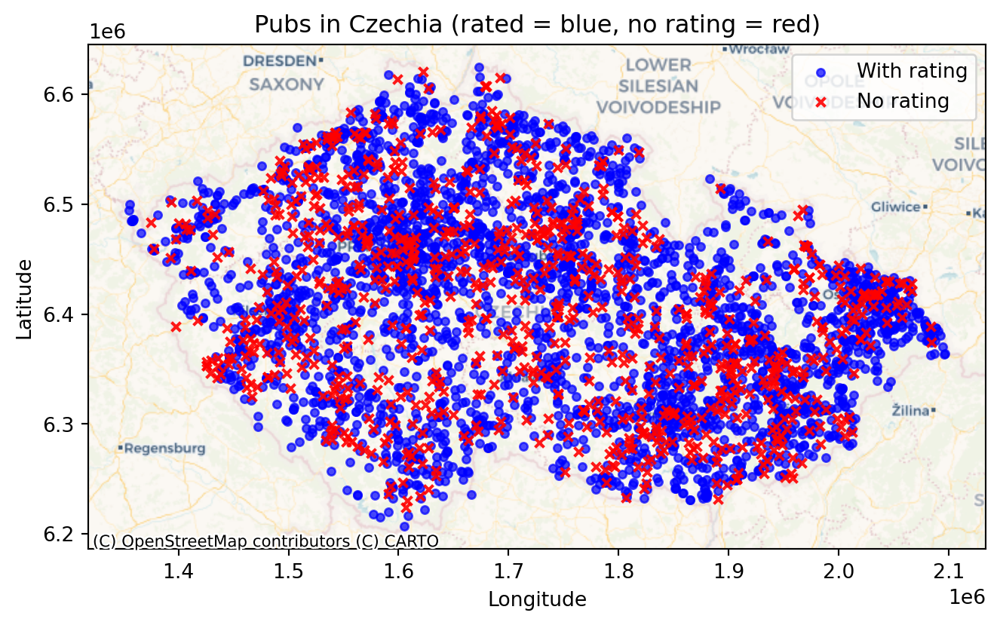

In [21]:
plot_filter_rating(czech_pubs_df, "Czechia", marker_size_dots=15, marker_size_x=20)

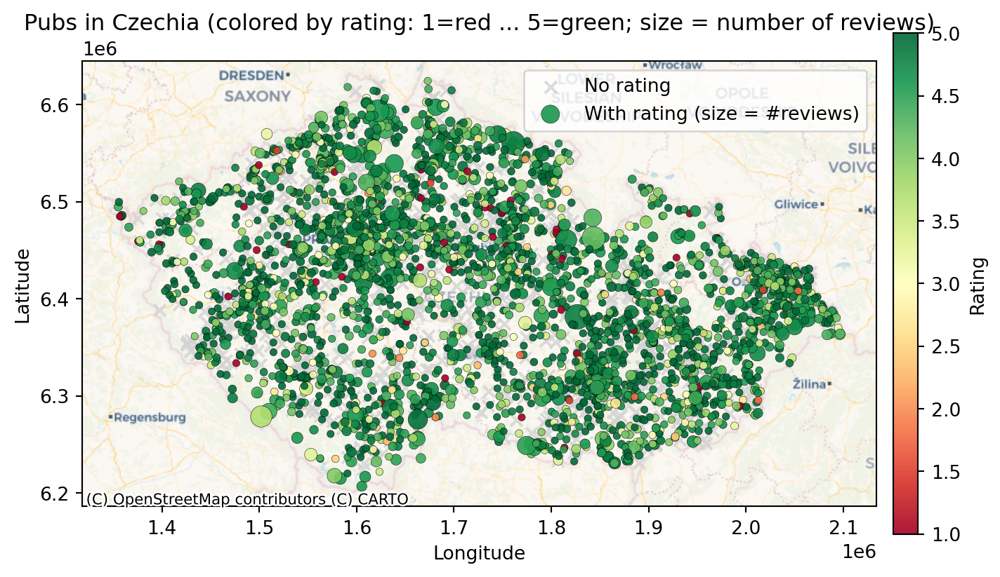

In [22]:
plot_rating(czech_pubs_df, "Czechia", 15, 175)

/tmp/ipykernel_488815/1223864519.py:157: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




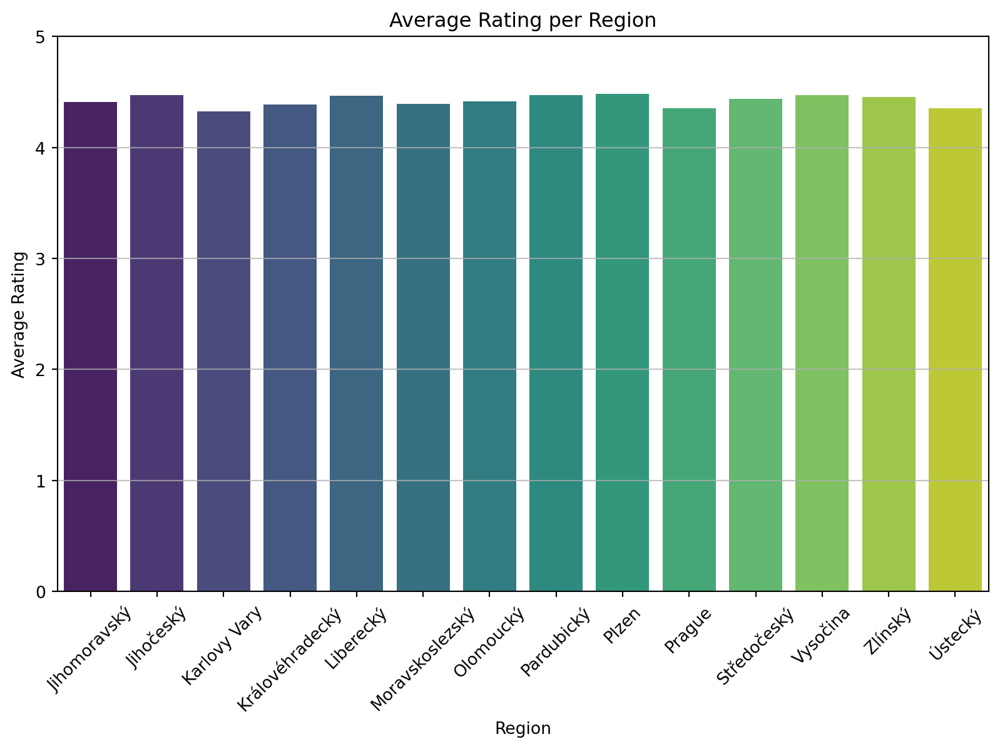

In [23]:
plot_average_rating_per_region(czech_pubs_df)

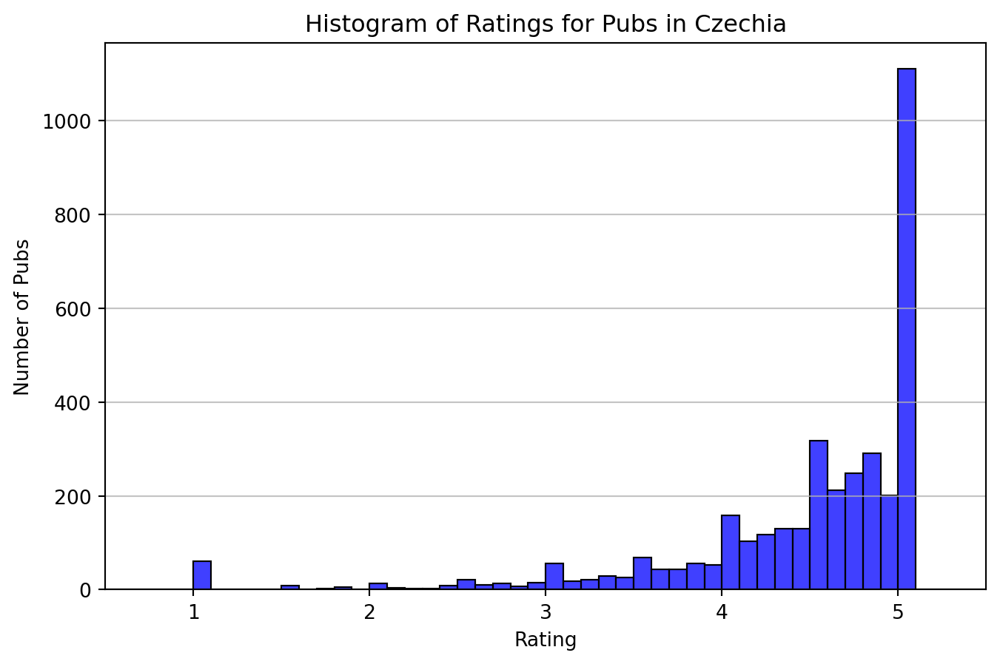

In [24]:
plot_rating_histogram(czech_pubs_df, "Czechia")

In [25]:
print_min_max_rating_filtered(czech_pubs_df,1)

Minimum rating: 1.0
Number of pubs with minimum rating: 61
                          name  rating  number_of_reviews
           Mazelovská hospůdka     1.0                1.0
   Hospoda sídliště Vajgar 673     1.0                1.0
            Hostinec U Rybníka     1.0                1.0
           Hostinec U Kudličků     1.0                1.0
                Hospoda U Orla     1.0                2.0
          Hospůdka ve Zvoničce     1.0                1.0
     Pohostinství Na Sokolovně     1.0                1.0
              Pivnica U Drtiča     1.0                2.0
                 U Průmyslovky     1.0                2.0
                Hospoda Skalka     1.0                1.0
           Hostinec U Tří čápů     1.0                1.0
              Cuong Nguyen Duc     1.0                1.0
          Obecní hospoda Lodín     1.0                1.0
                 Hostinec XIII     1.0                1.0
            Hospoda U Slávisty     1.0                1.0
          Hos

In [26]:
print_min_max_rating_filtered(czech_pubs_df)

Minimum rating: 2.7
Number of pubs with minimum rating: 3
                    name  rating  number_of_reviews
       Hostinec u Paseků     2.7               29.0
Hostinec Lovecký zámeček     2.7               21.0
         Hospůdka U vlka     2.7               10.0

Maximum rating: 5.0
Number of pubs with maximum rating: 39
                               name  rating  number_of_reviews
            Hostinec Zvláštní škola     5.0               18.0
                   Hospoda u Zemanů     5.0               22.0
             Hospůdka ve Slunečnici     5.0               15.0
                     Hospůdka Libín     5.0               12.0
                    Hospoda Kačlehy     5.0              109.0
               Hospoda pod Kostelem     5.0               10.0
                Hospůdka Valtrovice     5.0               18.0
  Avalon - Keltská středověká krčma     5.0               56.0
                  Hvozdecká hospoda     5.0               47.0
                 Hospůdka U Kamzíka     5.0 

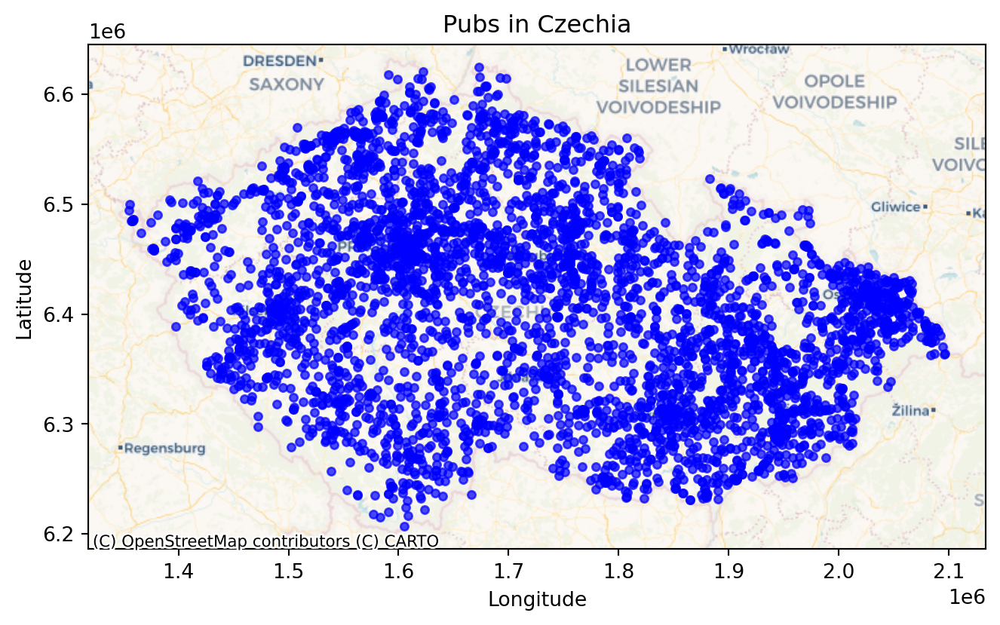

In [27]:
plot_all_pubs(czech_pubs_df, "Czechia", marker_size=15)

/tmp/ipykernel_488815/1223864519.py:222: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



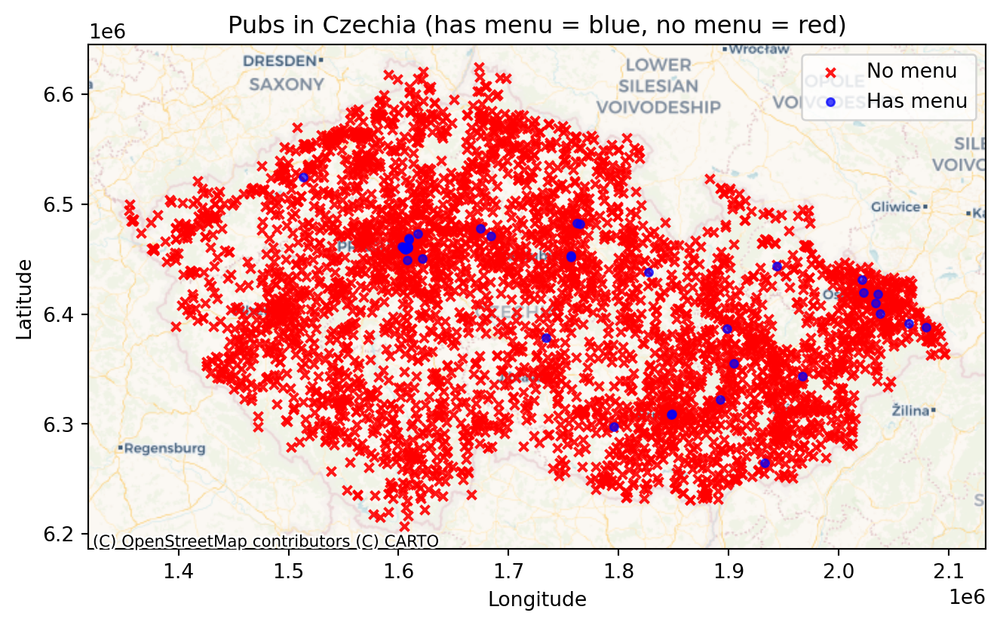

In [28]:
plot_filter_price(czech_pubs_df, "Czechia", marker_size_dots=15, marker_size_x=20)

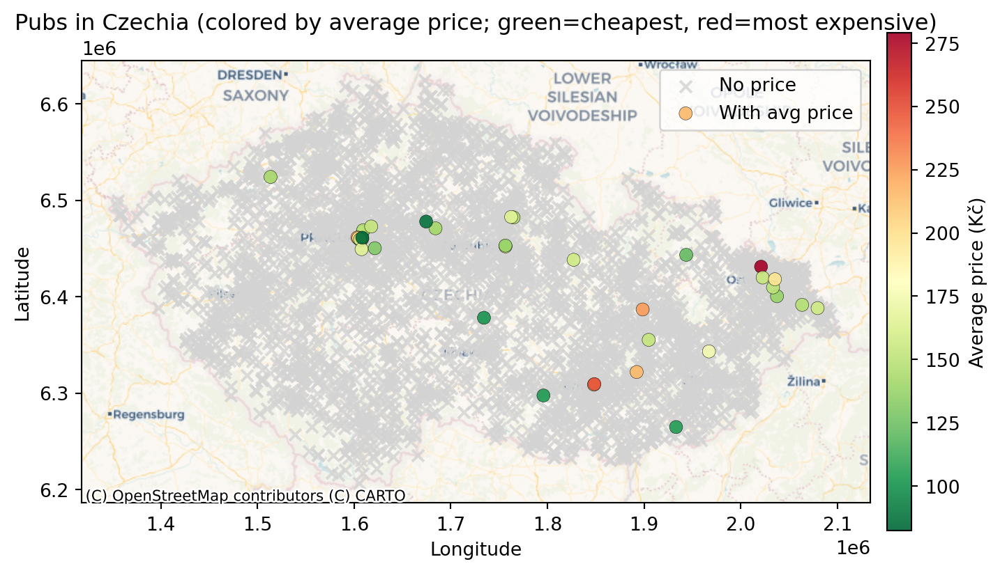

In [29]:
plot_price(czech_pubs_df, "Czechia")

In [30]:
print_min_max_price(czech_pubs_df)

Minimum average price: 82.50 Kč
Number of pubs with minimum average price: 1
          name  avg_price
Pivnice U Járy       82.5

Maximum average price: 279.00 Kč
Number of pubs with maximum average price: 1
                 name  avg_price
Restaurace KD Kozmice      279.0
